In [1]:
from bs4 import BeautifulSoup
import requests
import pandas as pd
import geopandas as gpd
import folium


In [2]:
#link da wikipedia com os dados utilizados
wiki_estadios = "https://pt.wikipedia.org/wiki/Lista_dos_maiores_est%C3%A1dios_de_futebol_do_Brasil"

In [3]:
#Utilizei o requests para obter o HTML da página
response = requests.get(wiki_estadios)

In [4]:
#Utilizei a biblioteca BeautifulSoup para analisar o html
soup = BeautifulSoup(response.text , "html.parser")

In [5]:
#Após inspecionar o código da pagína identifiquei que o contéudo da tabela pode ser encontrado buscando o "table"
pegar_tabela = soup.find("table" )

In [6]:
#Agora utilizei o pandas para ler o conteúdo da variável "pegar tabela"
df = pd.read_html(str(pegar_tabela))

In [7]:
#Como podemos observar o conteúdo veio em forma de lista
df

[     Pos.            Estádio          Localidade Unidade federativa  \
 0       1           Maracanã      Rio de Janeiro                 RJ   
 1       2     Mané Garrincha            Brasília                 DF   
 2       3            Morumbi           São Paulo                 SP   
 3       4           Castelão           Fortaleza                 CE   
 4       5           Mineirão      Belo Horizonte                 MG   
 ..    ...                ...                 ...                ...   
 144   138  Presidente Médici           Itabaiana                 SE   
 145   138           Ribeirão      Tocantinópolis                 TO   
 146   138           Romeirão   Juazeiro do Norte                 CE   
 147   138     Passo das Emas  Lucas do Rio Verde                 MT   
 148   138             10.000                 NaN                NaN   
 
      Capacidade  
 0        78.838  
 1        72.788  
 2        72.039  
 3        63.903  
 4        61.846  
 ..          ...  
 

In [8]:
#Aqui transformei a lista em Dataframe
Df_Estadios = df[0]


In [9]:
#Esse comando faz com que plotemos o dataframe inteiro e não extritamente necessário.
pd .set_option("display.max_rows", None, "display.max_columns", None)

In [10]:
Df_Estadios

,Pos.,Estádio,Localidade,Unidade federativa,Capacidade
0,1,Maracanã,Rio de Janeiro,RJ,78.838
1,2,Mané Garrincha,Brasília,DF,72.788
2,3,Morumbi,São Paulo,SP,72.039
3,4,Castelão,Fortaleza,CE,63.903
4,5,Mineirão,Belo Horizonte,MG,61.846
5,6,Arruda,Recife,PE,60.044
6,7,Arena do Grêmio,Porto Alegre,RS,55.662
7,8,Parque do Sabiá,Uberlândia,MG,53.350
8,9,Albertão,Teresina,PI,52.296
9,10,Beira-Rio,Porto Alegre,RS,50.128


In [11]:
#Verificamos os tipos de dados
Df_Estadios.dtypes

Pos.                    int64
Estádio                object
Localidade             object
Unidade federativa     object
Capacidade            float64
dtype: object

In [12]:
#Os procedimentos seguintes foram para o ponto da coluna capacidade e interpre-la como INT sem distorção
Df_Estadios['Capacidade'] = Df_Estadios['Capacidade']*1000 
Df_Estadios.dropna(inplace= True)

In [13]:
Df_Estadios["Capacidade"] = Df_Estadios["Capacidade"].astype(int)
Df_Estadios

,Pos.,Estádio,Localidade,Unidade federativa,Capacidade
0,1,Maracanã,Rio de Janeiro,RJ,78838
1,2,Mané Garrincha,Brasília,DF,72788
2,3,Morumbi,São Paulo,SP,72039
3,4,Castelão,Fortaleza,CE,63903
4,5,Mineirão,Belo Horizonte,MG,61846
5,6,Arruda,Recife,PE,60044
6,7,Arena do Grêmio,Porto Alegre,RS,55662
7,8,Parque do Sabiá,Uberlândia,MG,53350
8,9,Albertão,Teresina,PI,52296
9,10,Beira-Rio,Porto Alegre,RS,50128


In [14]:
#Aqui temos o dataframe com a coluna capacidade tratada
Df_Estadios

,Pos.,Estádio,Localidade,Unidade federativa,Capacidade
0,1,Maracanã,Rio de Janeiro,RJ,78838
1,2,Mané Garrincha,Brasília,DF,72788
2,3,Morumbi,São Paulo,SP,72039
3,4,Castelão,Fortaleza,CE,63903
4,5,Mineirão,Belo Horizonte,MG,61846
5,6,Arruda,Recife,PE,60044
6,7,Arena do Grêmio,Porto Alegre,RS,55662
7,8,Parque do Sabiá,Uberlândia,MG,53350
8,9,Albertão,Teresina,PI,52296
9,10,Beira-Rio,Porto Alegre,RS,50128


In [15]:
#Agora selecionamos apenas os estadios da região sul
r_sul = Df_Estadios.loc[(Df_Estadios["Unidade federativa"] == "RS")| (Df_Estadios["Unidade federativa"] == "SC")| (Df_Estadios["Unidade federativa"] == "PR")]

In [16]:
r_sul

,Pos.,Estádio,Localidade,Unidade federativa,Capacidade
6,7,Arena do Grêmio,Porto Alegre,RS,55662
9,10,Beira-Rio,Porto Alegre,RS,50128
19,20,Arena da Baixada,Curitiba,PR,42372
21,22,Couto Pereira,Curitiba,PR,40501
31,32,Estádio do Café,Londrina,PR,30000
39,40,Regional Arnaldo Busatto,Cascavel,PR,25000
43,44,Centenário,Caxias do Sul,RS,22131
44,45,Colosso da Lagoa,Erechim,RS,22000
50,51,Arena Joinville,Joinville,SC,20160
54,55,Alfredo Jaconi,Caxias do Sul,RS,19924


In [17]:
del r_sul["Pos."]

In [18]:
r_sul.reset_index(drop=True, inplace=True)
r_sul

,Estádio,Localidade,Unidade federativa,Capacidade
0,Arena do Grêmio,Porto Alegre,RS,55662
1,Beira-Rio,Porto Alegre,RS,50128
2,Arena da Baixada,Curitiba,PR,42372
3,Couto Pereira,Curitiba,PR,40501
4,Estádio do Café,Londrina,PR,30000
5,Regional Arnaldo Busatto,Cascavel,PR,25000
6,Centenário,Caxias do Sul,RS,22131
7,Colosso da Lagoa,Erechim,RS,22000
8,Arena Joinville,Joinville,SC,20160
9,Alfredo Jaconi,Caxias do Sul,RS,19924


Agora vamos trabalhar com as bibliotecas de dados espaciais para fazer a geolocalização, tratamento e criar os mapas.


In [19]:
#Aqui criei um looping para Geocodificar e pegar as coordenadas dos estádios
from geopy.geocoders import Nominatim
e_latitude = []
e_longitude =  []
e_location = []
estadios_nao_encontrados = []
#Aqui usei o try para tentar localizar as coordenadas, caso não encontre o except preenche as listas com os estadios nao encontrados
for estadio in r_sul["Estádio"]:
    try:
        geolocator = Nominatim(user_agent="u_pods_bf")
        location = geolocator.geocode("Estádio " + estadio)
        e_latitude.append(location.latitude)
        e_longitude.append(location.longitude)
        e_location.append(location)
    except AttributeError:
        estadios_nao_encontrados.append(estadio)
        e_latitude.append(0)
        e_longitude.append(0)
        e_location.append("NaN")
        print(estadio)
  
            
        

                

Regional Arnaldo Busatto
Érton Coelho Queiroz
Complexo Esportivo da Ulbra


In [20]:
#Fiz uma busca para encontrar os NAN
e_longitude

[-51.194029188293065,
 -42.55235295475078,
 -46.39440550380564,
 -46.8767471,
 -75.5809805,
 0,
 -56.152698659771886,
 -52.26489236225326,
 -48.83349956813208,
 -51.17623677246522,
 -49.36767700483055,
 -48.58646580892749,
 -48.6782287,
 -49.25581718514153,
 -51.93803540038412,
 -52.60698180721067,
 -52.33606216950615,
 -52.376390700313806,
 -51.53660925529764,
 -46.8751,
 -50.15657943685897,
 0,
 0]

In [21]:
#Aqui inseri o conteúdo das listas no dataframe
r_sul["Latitude"] = e_latitude
r_sul["Longitude"] = e_longitude
r_sul["End"] = e_location

<ipython-input-21-baefcd9a42ea>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  r_sul["Latitude"] = e_latitude
<ipython-input-21-baefcd9a42ea>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  r_sul["Longitude"] = e_longitude
<ipython-input-21-baefcd9a42ea>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

In [22]:
#Aqui inseri o conteúdo das listas no dataframe
r_sul["Latitude"] = e_latitude
r_sul["Longitude"] = e_longitude
r_sul["Endereco"] = e_location

<ipython-input-22-84638e8a090a>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  r_sul["Latitude"] = e_latitude
<ipython-input-22-84638e8a090a>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  r_sul["Longitude"] = e_longitude
<ipython-input-22-84638e8a090a>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

In [23]:
#Transformei em Geodataframe
Gdf_Estadios = gpd.GeoDataFrame(
    r_sul, geometry=gpd.points_from_xy(r_sul.Longitude, r_sul.Latitude))

In [24]:
Gdf_Estadios

,Estádio,Localidade,Unidade federativa,Capacidade,Latitude,Longitude,End,Endereco,geometry
0,Arena do Grêmio,Porto Alegre,RS,55662,-29.973991,-51.194029,"(Arena do Grêmio, Rua Ricardo Seibel de Freita...","(Arena do Grêmio, Rua Ricardo Seibel de Freita...",POINT (-51.19403 -29.97399)
1,Beira-Rio,Porto Alegre,RS,50128,-21.285521,-42.552353,"(Estádio Beira Rio, Santana de Cataguases, Mic...","(Estádio Beira Rio, Santana de Cataguases, Mic...",POINT (-42.55235 -21.28552)
2,Arena da Baixada,Curitiba,PR,42372,-23.969594,-46.394406,"(Estádio Mansueto Pierotti, 539, Rua Marquês d...","(Estádio Mansueto Pierotti, 539, Rua Marquês d...",POINT (-46.39441 -23.96959)
3,Couto Pereira,Curitiba,PR,40501,-23.209242,-46.876747,"(Rua Dirceu Pereira da Silva, Vila Manfredi, V...","(Rua Dirceu Pereira da Silva, Vila Manfredi, V...",POINT (-46.87675 -23.20924)
4,Estádio do Café,Londrina,PR,30000,6.255305,-75.580980,"(El Café, 64C-39, Calle 49B, Suramericana, Com...","(El Café, 64C-39, Calle 49B, Suramericana, Com...",POINT (-75.58098 6.25531)
5,Regional Arnaldo Busatto,Cascavel,PR,25000,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000)
6,Centenário,Caxias do Sul,RS,22131,-34.894527,-56.152699,"(Estadio Centenario, Avenida Doctor Américo Ri...","(Estadio Centenario, Avenida Doctor Américo Ri...",POINT (-56.15270 -34.89453)
7,Colosso da Lagoa,Erechim,RS,22000,-27.651256,-52.264892,"(Colosso da Lagoa, Rua Doutora Yvone Marsico, ...","(Colosso da Lagoa, Rua Doutora Yvone Marsico, ...",POINT (-52.26489 -27.65126)
8,Arena Joinville,Joinville,SC,20160,-26.316855,-48.833500,"(Arena Joinville, 1084, Rua Inácio Bastos, Buc...","(Arena Joinville, 1084, Rua Inácio Bastos, Buc...",POINT (-48.83350 -26.31686)
9,Alfredo Jaconi,Caxias do Sul,RS,19924,-29.162310,-51.176237,"(Estádio Alfredo Jaconi, Avenida São João, Cen...","(Estádio Alfredo Jaconi, Avenida São João, Cen...",POINT (-51.17624 -29.16231)


<AxesSubplot:>

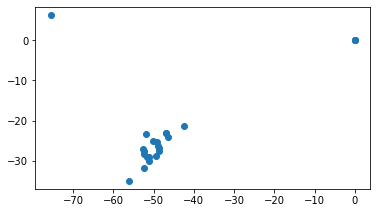

In [25]:
#Verifiquei o conteúdo(podemos perceber alguns erros)
Gdf_Estadios.plot()

In [26]:
#Aqui verifiquei apenas os estadios que possuem coordenadas para observarmos melhor.
checagem = Gdf_Estadios.loc[Gdf_Estadios["Latitude"] != 0]

<AxesSubplot:>

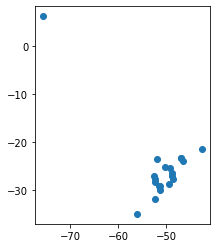

In [27]:
#A Longitude mais baixa no Brasil é de -53o 23'50", no gráfico é possível observar que tem um ponto abaixo disso.
checagem.plot()

In [109]:
#Puxei o shapefile dos municipios brasileiros para auxiliar nas correções
cidades = gpd.read_file("C:/Users/eduar/OneDrive/Área de Trabalho/Curso GeoPandas/br_municipios_20200807/BR_Municipios_2019.shp", index_col = "NM_MUN")


<AxesSubplot:>

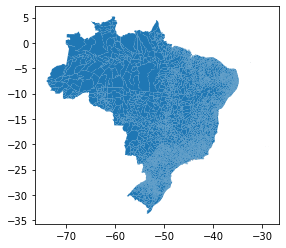

In [29]:
cidades.plot()

In [30]:
#Vamos verificar o conteúdo do shape para ver como podemos usa-lo
cidades.tail()

,CD_MUN,NM_MUN,SIGLA_UF,AREA_KM2,geometry
5567,5222005,Vianópolis,GO,954.284,"POLYGON ((-48.53842 -16.75003, -48.54051 -16.7..."
5568,5222054,Vicentinópolis,GO,737.255,"POLYGON ((-49.90713 -17.61460, -49.90588 -17.6..."
5569,5222203,Vila Boa,GO,1060.172,"POLYGON ((-47.07742 -15.06330, -47.07747 -15.0..."
5570,5222302,Vila Propício,GO,2181.583,"POLYGON ((-48.91463 -15.20939, -48.91462 -15.2..."
5571,5300108,Brasília,DF,5760.783,"POLYGON ((-47.81455 -16.04995, -47.81478 -16.0..."


Podemos observar que temos uma coluna com o nome dos municípios em UTF-8. Vamos tentar usa-la para fazer a correção.


In [31]:
#Repare que os municípios dos estádios podem ser encontrados na coluna localidade.
Gdf_Estadios

,Estádio,Localidade,Unidade federativa,Capacidade,Latitude,Longitude,End,Endereco,geometry
0,Arena do Grêmio,Porto Alegre,RS,55662,-29.973991,-51.194029,"(Arena do Grêmio, Rua Ricardo Seibel de Freita...","(Arena do Grêmio, Rua Ricardo Seibel de Freita...",POINT (-51.19403 -29.97399)
1,Beira-Rio,Porto Alegre,RS,50128,-21.285521,-42.552353,"(Estádio Beira Rio, Santana de Cataguases, Mic...","(Estádio Beira Rio, Santana de Cataguases, Mic...",POINT (-42.55235 -21.28552)
2,Arena da Baixada,Curitiba,PR,42372,-23.969594,-46.394406,"(Estádio Mansueto Pierotti, 539, Rua Marquês d...","(Estádio Mansueto Pierotti, 539, Rua Marquês d...",POINT (-46.39441 -23.96959)
3,Couto Pereira,Curitiba,PR,40501,-23.209242,-46.876747,"(Rua Dirceu Pereira da Silva, Vila Manfredi, V...","(Rua Dirceu Pereira da Silva, Vila Manfredi, V...",POINT (-46.87675 -23.20924)
4,Estádio do Café,Londrina,PR,30000,6.255305,-75.580980,"(El Café, 64C-39, Calle 49B, Suramericana, Com...","(El Café, 64C-39, Calle 49B, Suramericana, Com...",POINT (-75.58098 6.25531)
5,Regional Arnaldo Busatto,Cascavel,PR,25000,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000)
6,Centenário,Caxias do Sul,RS,22131,-34.894527,-56.152699,"(Estadio Centenario, Avenida Doctor Américo Ri...","(Estadio Centenario, Avenida Doctor Américo Ri...",POINT (-56.15270 -34.89453)
7,Colosso da Lagoa,Erechim,RS,22000,-27.651256,-52.264892,"(Colosso da Lagoa, Rua Doutora Yvone Marsico, ...","(Colosso da Lagoa, Rua Doutora Yvone Marsico, ...",POINT (-52.26489 -27.65126)
8,Arena Joinville,Joinville,SC,20160,-26.316855,-48.833500,"(Arena Joinville, 1084, Rua Inácio Bastos, Buc...","(Arena Joinville, 1084, Rua Inácio Bastos, Buc...",POINT (-48.83350 -26.31686)
9,Alfredo Jaconi,Caxias do Sul,RS,19924,-29.162310,-51.176237,"(Estádio Alfredo Jaconi, Avenida São João, Cen...","(Estádio Alfredo Jaconi, Avenida São João, Cen...",POINT (-51.17624 -29.16231)


In [32]:
#Então vamos usar o comando "isin" para verificar se podemos encontrar todos os municpios da tabela dos estadios no shape dos municpios.
Gdf_Estadios.Localidade.isin(cidades.NM_MUN).astype(bool)


0     True
1     True
2     True
3     True
4     True
5     True
6     True
7     True
8     True
9     True
10    True
11    True
12    True
13    True
14    True
15    True
16    True
17    True
18    True
19    True
20    True
21    True
22    True
Name: Localidade, dtype: bool

In [33]:
#Antes de seguirmos,é muito importante verificar se os geodataframes estão no mesmo sistema de coordenadas.
print(cidades.crs)
print(Gdf_Estadios.crs)

epsg:4674
None


In [34]:
#Vamos ajustar o sistema de coordenadas dos estádios
Gdf_Estadios.set_crs("EPSG:4326", inplace= True)

,Estádio,Localidade,Unidade federativa,Capacidade,Latitude,Longitude,End,Endereco,geometry
0,Arena do Grêmio,Porto Alegre,RS,55662,-29.973991,-51.194029,"(Arena do Grêmio, Rua Ricardo Seibel de Freita...","(Arena do Grêmio, Rua Ricardo Seibel de Freita...",POINT (-51.19403 -29.97399)
1,Beira-Rio,Porto Alegre,RS,50128,-21.285521,-42.552353,"(Estádio Beira Rio, Santana de Cataguases, Mic...","(Estádio Beira Rio, Santana de Cataguases, Mic...",POINT (-42.55235 -21.28552)
2,Arena da Baixada,Curitiba,PR,42372,-23.969594,-46.394406,"(Estádio Mansueto Pierotti, 539, Rua Marquês d...","(Estádio Mansueto Pierotti, 539, Rua Marquês d...",POINT (-46.39441 -23.96959)
3,Couto Pereira,Curitiba,PR,40501,-23.209242,-46.876747,"(Rua Dirceu Pereira da Silva, Vila Manfredi, V...","(Rua Dirceu Pereira da Silva, Vila Manfredi, V...",POINT (-46.87675 -23.20924)
4,Estádio do Café,Londrina,PR,30000,6.255305,-75.580980,"(El Café, 64C-39, Calle 49B, Suramericana, Com...","(El Café, 64C-39, Calle 49B, Suramericana, Com...",POINT (-75.58098 6.25531)
5,Regional Arnaldo Busatto,Cascavel,PR,25000,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000)
6,Centenário,Caxias do Sul,RS,22131,-34.894527,-56.152699,"(Estadio Centenario, Avenida Doctor Américo Ri...","(Estadio Centenario, Avenida Doctor Américo Ri...",POINT (-56.15270 -34.89453)
7,Colosso da Lagoa,Erechim,RS,22000,-27.651256,-52.264892,"(Colosso da Lagoa, Rua Doutora Yvone Marsico, ...","(Colosso da Lagoa, Rua Doutora Yvone Marsico, ...",POINT (-52.26489 -27.65126)
8,Arena Joinville,Joinville,SC,20160,-26.316855,-48.833500,"(Arena Joinville, 1084, Rua Inácio Bastos, Buc...","(Arena Joinville, 1084, Rua Inácio Bastos, Buc...",POINT (-48.83350 -26.31686)
9,Alfredo Jaconi,Caxias do Sul,RS,19924,-29.162310,-51.176237,"(Estádio Alfredo Jaconi, Avenida São João, Cen...","(Estádio Alfredo Jaconi, Avenida São João, Cen...",POINT (-51.17624 -29.16231)


Agora vamos selecionar apenas as cidades com os estádios.

<AxesSubplot:>

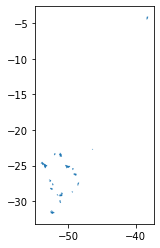

In [35]:
#Vamos armazenar o resultado na variável abaixo.
cidades_com_estadio = cidades.loc[cidades.NM_MUN.isin(Gdf_Estadios.Localidade) == True]
cidades_com_estadio.plot()

In [36]:
#Agora temos uma série de polígonos com as cidades de interesse.
cidades_com_estadio

,CD_MUN,NM_MUN,SIGLA_UF,AREA_KM2,geometry
931,2303501,Cascavel,CE,838.115,"POLYGON ((-38.26283 -4.07337, -38.26212 -4.070..."
3054,3169109,Toledo,MG,136.776,"POLYGON ((-46.45485 -22.67111, -46.45158 -22.6..."
3980,4104808,Cascavel,PR,2101.074,"POLYGON ((-53.54842 -24.95922, -53.54916 -24.9..."
4005,4106902,Curitiba,PR,434.892,"POLYGON ((-49.25538 -25.34825, -49.25536 -25.3..."
4102,4113700,Londrina,PR,1652.569,"POLYGON ((-51.21005 -23.30824, -51.21023 -23.3..."
4120,4115200,Maringá,PR,487.012,"POLYGON ((-52.08764 -23.39082, -52.08593 -23.3..."
4186,4119905,Ponta Grossa,PR,2054.732,"POLYGON ((-49.84072 -25.04429, -49.83978 -25.0..."
4290,4127700,Toledo,PR,1196.756,"POLYGON ((-53.90687 -24.72636, -53.91371 -24.7..."
4377,4204202,Chapecó,SC,624.846,"POLYGON ((-52.70692 -27.09636, -52.70749 -27.0..."
4385,4204608,Criciúma,SC,234.865,"POLYGON ((-49.46676 -28.68948, -49.46679 -28.6..."


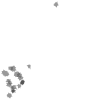

In [37]:
#Para facilitar os procedimentos seguintes vamos transformar a lista de poligonos em apenas um multipolygon.
shape_unico = cidades_com_estadio.geometry.unary_union
shape_unico


In [38]:
#Agora armazenamos a geometria em um geodataframe
envgdf = gpd.GeoDataFrame(gpd.GeoSeries(shape_unico),index = None )
envgdf

,0
0,"MULTIPOLYGON (((-52.47659 -31.71409, -52.47653..."


In [39]:
envgdf = envgdf.rename(columns={0:'geometry'}).set_geometry('geometry')

In [40]:
envgdf.set_crs("EPSG:4326",inplace = True)
    

,geometry
0,"MULTIPOLYGON (((-52.47659 -31.71409, -52.47653..."


<AxesSubplot:>

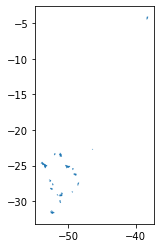

In [41]:
envgdf.plot()

<AxesSubplot:>

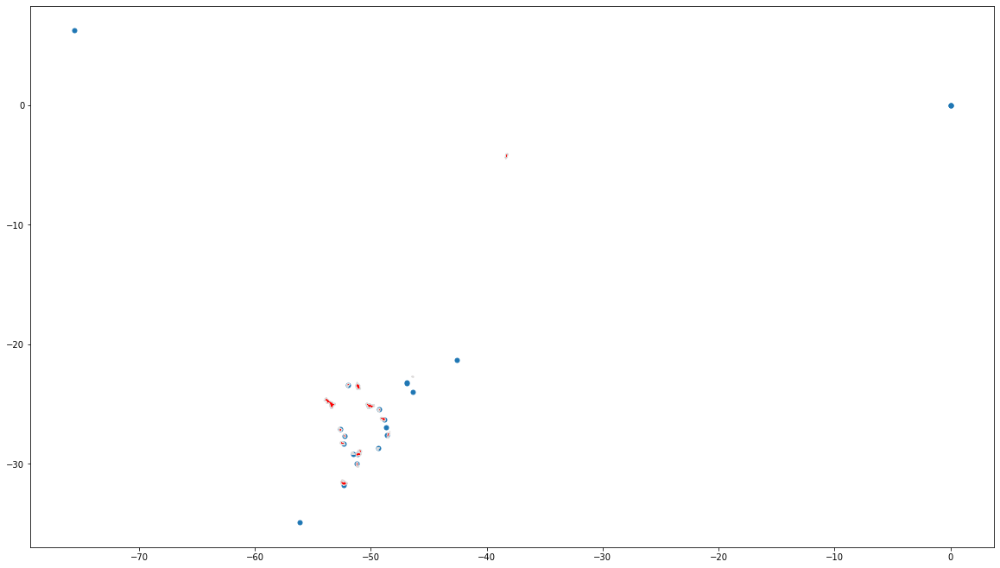

In [42]:
#Fazemos uma avaliação dos dois geodataframes sobrepostos.
ax = envgdf.plot(figsize=(20,20), color='red', edgecolor='gainsboro', zorder=3)
Gdf_Estadios.plot(ax=ax, markersize=25)

In [43]:
print(envgdf.crs)
print(Gdf_Estadios.crs)

EPSG:4326
EPSG:4326


Agora utilizaremos duas técnicas de "overlay" muito utilizadas em Geoprocessamento e análise espacial, o intersection e o a Symmetrical Difference
Você pode saber mais nesse link: https://geopandas.org/set_operations.html




In [44]:
#O intersection sobrepoe as duas camadas(estadios e poligo da cidades) e retorna apenas aqueles que sobrepõem.
intersecao = gpd.overlay(Gdf_Estadios,envgdf, how = "intersection")
intersecao

,Estádio,Localidade,Unidade federativa,Capacidade,Latitude,Longitude,End,Endereco,geometry
0,Arena do Grêmio,Porto Alegre,RS,55662,-29.973991,-51.194029,"(Arena do Grêmio, Rua Ricardo Seibel de Freita...","(Arena do Grêmio, Rua Ricardo Seibel de Freita...",POINT (-51.19403 -29.97399)
1,Colosso da Lagoa,Erechim,RS,22000,-27.651256,-52.264892,"(Colosso da Lagoa, Rua Doutora Yvone Marsico, ...","(Colosso da Lagoa, Rua Doutora Yvone Marsico, ...",POINT (-52.26489 -27.65126)
2,Arena Joinville,Joinville,SC,20160,-26.316855,-48.833500,"(Arena Joinville, 1084, Rua Inácio Bastos, Buc...","(Arena Joinville, 1084, Rua Inácio Bastos, Buc...",POINT (-48.83350 -26.31686)
3,Alfredo Jaconi,Caxias do Sul,RS,19924,-29.162310,-51.176237,"(Estádio Alfredo Jaconi, Avenida São João, Cen...","(Estádio Alfredo Jaconi, Avenida São João, Cen...",POINT (-51.17624 -29.16231)
4,Heriberto Hülse,Criciúma,SC,19900,-28.684339,-49.367677,"(Estádio Heriberto Hülse, 3522, Rua 13 de Maio...","(Estádio Heriberto Hülse, 3522, Rua 13 de Maio...",POINT (-49.36768 -28.68434)
5,Orlando Scarpelli,Florianópolis,SC,19584,-27.585546,-48.586466,"(Estádio Orlando Scarpelli, 194, Rua Humaitá, ...","(Estádio Orlando Scarpelli, 194, Rua Humaitá, ...",POINT (-48.58647 -27.58555)
6,Vila Capanema,Curitiba,PR,17140,-25.439483,-49.255817,"(Estádio Durival Britto e Silva, 1100, Rua Eng...","(Estádio Durival Britto e Silva, 1100, Rua Eng...",POINT (-49.25582 -25.43948)
7,Willie Davids,Maringá,PR,16226,-23.414152,-51.938035,"(Estádio Willie Davids, Avenida Herval, Jardim...","(Estádio Willie Davids, Avenida Herval, Jardim...",POINT (-51.93804 -23.41415)
8,Arena Condá,Chapecó,SC,15765,-27.104093,-52.606982,"(Arena Condá, Rua Clevelândia - E, Centro, Dis...","(Arena Condá, Rua Clevelândia - E, Centro, Dis...",POINT (-52.60698 -27.10409)
9,Boca do Lobo,Pelotas,RS,15478,-31.761068,-52.336062,"(Estádio Boca do Lobo, 300, Rua Felix da Cunha...","(Estádio Boca do Lobo, 300, Rua Felix da Cunha...",POINT (-52.33606 -31.76107)


In [45]:
# O symmetric difference faz exatamente o oposto, retorna os objetos que não se sobrepoem.
diferenca = gpd.overlay(Gdf_Estadios,envgdf, how = "symmetric_difference")
diferenca

,Estádio,Localidade,Unidade federativa,Capacidade,Latitude,Longitude,End,Endereco,geometry
0,Beira-Rio,Porto Alegre,RS,50128.0,-21.285521,-42.552353,"(Estádio Beira Rio, Santana de Cataguases, Mic...","(Estádio Beira Rio, Santana de Cataguases, Mic...",POINT (-42.55235 -21.28552)
1,Arena da Baixada,Curitiba,PR,42372.0,-23.969594,-46.394406,"(Estádio Mansueto Pierotti, 539, Rua Marquês d...","(Estádio Mansueto Pierotti, 539, Rua Marquês d...",POINT (-46.39441 -23.96959)
2,Couto Pereira,Curitiba,PR,40501.0,-23.209242,-46.876747,"(Rua Dirceu Pereira da Silva, Vila Manfredi, V...","(Rua Dirceu Pereira da Silva, Vila Manfredi, V...",POINT (-46.87675 -23.20924)
3,Estádio do Café,Londrina,PR,30000.0,6.255305,-75.580980,"(El Café, 64C-39, Calle 49B, Suramericana, Com...","(El Café, 64C-39, Calle 49B, Suramericana, Com...",POINT (-75.58098 6.25531)
4,Regional Arnaldo Busatto,Cascavel,PR,25000.0,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000)
5,Centenário,Caxias do Sul,RS,22131.0,-34.894527,-56.152699,"(Estadio Centenario, Avenida Doctor Américo Ri...","(Estadio Centenario, Avenida Doctor Américo Ri...",POINT (-56.15270 -34.89453)
6,Ressacada,Florianópolis,SC,17826.0,-26.930466,-48.678229,"(Ressacada, Itajaí, Região Geográfica Imediata...","(Ressacada, Itajaí, Região Geográfica Imediata...",POINT (-48.67823 -26.93047)
7,14 de Dezembro,Toledo,PR,12500.0,-23.216691,-46.875100,"(Avenida Quatorze de Dezembro, Vila Maringá, V...","(Avenida Quatorze de Dezembro, Vila Maringá, V...",POINT (-46.87510 -23.21669)
8,Érton Coelho Queiroz,Curitiba,PR,10000.0,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000)
9,Complexo Esportivo da Ulbra,Canoas,RS,10000.0,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000)


Agora vamos nos atentar primeiramente ao geodataframe da diferença. Pois ele indica todos os estádios que não estão localizados no municípios indicados pela coluna localidade(obviamente os que preenchemos com coordenadas "0.0000" estão nessa lista)

# Voltando para o Scrapping

Aqui vamos retornar para as técnicas de webscrapping para tentar encontrar os endereços corretos dos estádios. 

Vamos o utilizar a própria busca do google para pegar o endereço corretor buscando pelo estádio e pelo municipio da coluna localidade procurando eliminar os erros de encontrados na coluna diferenca.

In [46]:
auxiliar = []
for index,row in diferenca.iterrows():
    try:
        busca_google = requests.get("https://www.google.com/search?q="+"Estádio "+row["Estádio"]+" "+row["Localidade"])
        soup = BeautifulSoup(busca_google.text,"html.parser")
        resultado2 = soup.find_all("span",class_="BNeawe tAd8D AP7Wnd")
        auxiliar.append(resultado2[0].text)
    except IndexError:
        auxiliar.append("Não encontrado")
        
    
    

In [47]:
auxiliar

['Av. Padre Cacique, 891 - Praia de Belas, Porto Alegre - RS, 90810-240',
 'R. Buenos Aires, 1260 - Água Verde, Curitiba - PR, 80250-070',
 'R. Ubaldino do Amaral, 63 - Alto da Glória, Curitiba - PR, 80060-195',
 'Av. Henrique Mansano, 889 - Jardim dos Alpes, Londrina - PR, 86075-000',
 'Av. Tito Muffato, 300 - Santo Onofre, Cascavel - PR, 85806-080',
 'R. Thomas Beltrão de Queiroz, 898 - Mal. Floriano, Caxias do Sul - RS, 95010-680',
 'Carianos, Florianópolis - SC, 88047-615',
 'R. da Faculdade, s/n - Jardim La Salle, Toledo - PR, 85903-040',
 'R. Pastor Antônio Pólito, 956 - Alto Boqueirão, Curitiba - PR, 81730-300',
 '877, R. Aurora, 851 - Mal. Rondon, Canoas - RS']

In [48]:
ajustado = []
for item in auxiliar:
    ajuste = item.replace("-", ",",1)
    ajustado.append(ajuste)

In [49]:
ajustado

['Av. Padre Cacique, 891 , Praia de Belas, Porto Alegre - RS, 90810-240',
 'R. Buenos Aires, 1260 , Água Verde, Curitiba - PR, 80250-070',
 'R. Ubaldino do Amaral, 63 , Alto da Glória, Curitiba - PR, 80060-195',
 'Av. Henrique Mansano, 889 , Jardim dos Alpes, Londrina - PR, 86075-000',
 'Av. Tito Muffato, 300 , Santo Onofre, Cascavel - PR, 85806-080',
 'R. Thomas Beltrão de Queiroz, 898 , Mal. Floriano, Caxias do Sul - RS, 95010-680',
 'Carianos, Florianópolis , SC, 88047-615',
 'R. da Faculdade, s/n , Jardim La Salle, Toledo - PR, 85903-040',
 'R. Pastor Antônio Pólito, 956 , Alto Boqueirão, Curitiba - PR, 81730-300',
 '877, R. Aurora, 851 , Mal. Rondon, Canoas - RS']

Após alguns testes, verifiquei que o OpenStreetMap encontra os endereços de rua quando utilizamos o identificador "Rua" ao invés de "R.".

Então vamos criar um loop para que quando ele se depare com esse erro de geocodificação, não substituimos r. por Rua.

Depois vamos colocar cada fragmento do endereço separado por "," em listas diferentes que utilizaremos para criar diversas combinações até que o OpenStreetMap localize todos os estádios.

In [50]:
l0 = []
l1 = []
l2 = []
l3 = []
l4 = []
for item in ajustado:  
    try:
        l0.append(item.split(",")[0])
        l1.append(item.split(",")[1])
        l2.append(item.split(",")[2])
        l3.append(item.split(",")[3])
        l4.append(item.split(",")[4])
    except IndexError:
        l4.append("")

        
diferenca["l0"] = l0
diferenca["l1"] = l1
diferenca["l2"] = l2
diferenca["l3"] = l3
diferenca["l4"] = l4       


In [51]:
diferenca

,Estádio,Localidade,Unidade federativa,Capacidade,Latitude,Longitude,End,Endereco,geometry,l0,l1,l2,l3,l4
0,Beira-Rio,Porto Alegre,RS,50128.0,-21.285521,-42.552353,"(Estádio Beira Rio, Santana de Cataguases, Mic...","(Estádio Beira Rio, Santana de Cataguases, Mic...",POINT (-42.55235 -21.28552),Av. Padre Cacique,891,Praia de Belas,Porto Alegre - RS,90810-240
1,Arena da Baixada,Curitiba,PR,42372.0,-23.969594,-46.394406,"(Estádio Mansueto Pierotti, 539, Rua Marquês d...","(Estádio Mansueto Pierotti, 539, Rua Marquês d...",POINT (-46.39441 -23.96959),R. Buenos Aires,1260,Água Verde,Curitiba - PR,80250-070
2,Couto Pereira,Curitiba,PR,40501.0,-23.209242,-46.876747,"(Rua Dirceu Pereira da Silva, Vila Manfredi, V...","(Rua Dirceu Pereira da Silva, Vila Manfredi, V...",POINT (-46.87675 -23.20924),R. Ubaldino do Amaral,63,Alto da Glória,Curitiba - PR,80060-195
3,Estádio do Café,Londrina,PR,30000.0,6.255305,-75.580980,"(El Café, 64C-39, Calle 49B, Suramericana, Com...","(El Café, 64C-39, Calle 49B, Suramericana, Com...",POINT (-75.58098 6.25531),Av. Henrique Mansano,889,Jardim dos Alpes,Londrina - PR,86075-000
4,Regional Arnaldo Busatto,Cascavel,PR,25000.0,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000),Av. Tito Muffato,300,Santo Onofre,Cascavel - PR,85806-080
5,Centenário,Caxias do Sul,RS,22131.0,-34.894527,-56.152699,"(Estadio Centenario, Avenida Doctor Américo Ri...","(Estadio Centenario, Avenida Doctor Américo Ri...",POINT (-56.15270 -34.89453),R. Thomas Beltrão de Queiroz,898,Mal. Floriano,Caxias do Sul - RS,95010-680
6,Ressacada,Florianópolis,SC,17826.0,-26.930466,-48.678229,"(Ressacada, Itajaí, Região Geográfica Imediata...","(Ressacada, Itajaí, Região Geográfica Imediata...",POINT (-48.67823 -26.93047),Carianos,Florianópolis,SC,88047-615,
7,14 de Dezembro,Toledo,PR,12500.0,-23.216691,-46.875100,"(Avenida Quatorze de Dezembro, Vila Maringá, V...","(Avenida Quatorze de Dezembro, Vila Maringá, V...",POINT (-46.87510 -23.21669),R. da Faculdade,s/n,Jardim La Salle,Toledo - PR,85903-040
8,Érton Coelho Queiroz,Curitiba,PR,10000.0,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000),R. Pastor Antônio Pólito,956,Alto Boqueirão,Curitiba - PR,81730-300
9,Complexo Esportivo da Ulbra,Canoas,RS,10000.0,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000),877,R. Aurora,851,Mal. Rondon,Canoas - RS


In [52]:
for item in diferenca["l0"]:
    if item.startswith("0") or item.startswith("1") or item.startswith("2") or item.startswith("3") or item.startswith("4") or item.startswith("5") or item.startswith("6") or item.startswith("7") or item.startswith("8") or item.startswith("9"):
        print(item)
        diferenca["l0"].replace(item, "auxiliar",inplace = True)

877


In [53]:
diferenca

,Estádio,Localidade,Unidade federativa,Capacidade,Latitude,Longitude,End,Endereco,geometry,l0,l1,l2,l3,l4
0,Beira-Rio,Porto Alegre,RS,50128.0,-21.285521,-42.552353,"(Estádio Beira Rio, Santana de Cataguases, Mic...","(Estádio Beira Rio, Santana de Cataguases, Mic...",POINT (-42.55235 -21.28552),Av. Padre Cacique,891,Praia de Belas,Porto Alegre - RS,90810-240
1,Arena da Baixada,Curitiba,PR,42372.0,-23.969594,-46.394406,"(Estádio Mansueto Pierotti, 539, Rua Marquês d...","(Estádio Mansueto Pierotti, 539, Rua Marquês d...",POINT (-46.39441 -23.96959),R. Buenos Aires,1260,Água Verde,Curitiba - PR,80250-070
2,Couto Pereira,Curitiba,PR,40501.0,-23.209242,-46.876747,"(Rua Dirceu Pereira da Silva, Vila Manfredi, V...","(Rua Dirceu Pereira da Silva, Vila Manfredi, V...",POINT (-46.87675 -23.20924),R. Ubaldino do Amaral,63,Alto da Glória,Curitiba - PR,80060-195
3,Estádio do Café,Londrina,PR,30000.0,6.255305,-75.580980,"(El Café, 64C-39, Calle 49B, Suramericana, Com...","(El Café, 64C-39, Calle 49B, Suramericana, Com...",POINT (-75.58098 6.25531),Av. Henrique Mansano,889,Jardim dos Alpes,Londrina - PR,86075-000
4,Regional Arnaldo Busatto,Cascavel,PR,25000.0,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000),Av. Tito Muffato,300,Santo Onofre,Cascavel - PR,85806-080
5,Centenário,Caxias do Sul,RS,22131.0,-34.894527,-56.152699,"(Estadio Centenario, Avenida Doctor Américo Ri...","(Estadio Centenario, Avenida Doctor Américo Ri...",POINT (-56.15270 -34.89453),R. Thomas Beltrão de Queiroz,898,Mal. Floriano,Caxias do Sul - RS,95010-680
6,Ressacada,Florianópolis,SC,17826.0,-26.930466,-48.678229,"(Ressacada, Itajaí, Região Geográfica Imediata...","(Ressacada, Itajaí, Região Geográfica Imediata...",POINT (-48.67823 -26.93047),Carianos,Florianópolis,SC,88047-615,
7,14 de Dezembro,Toledo,PR,12500.0,-23.216691,-46.875100,"(Avenida Quatorze de Dezembro, Vila Maringá, V...","(Avenida Quatorze de Dezembro, Vila Maringá, V...",POINT (-46.87510 -23.21669),R. da Faculdade,s/n,Jardim La Salle,Toledo - PR,85903-040
8,Érton Coelho Queiroz,Curitiba,PR,10000.0,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000),R. Pastor Antônio Pólito,956,Alto Boqueirão,Curitiba - PR,81730-300
9,Complexo Esportivo da Ulbra,Canoas,RS,10000.0,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000),auxiliar,R. Aurora,851,Mal. Rondon,Canoas - RS


In [54]:
for index,row in diferenca.iterrows():
    if row["l0"] == "auxiliar":
        diferenca.replace({row["l0"] : row["l1"],
        row["l1"] : row["l2"],
        row["l2"] : row["l3"],row["l3"] : row["l4"]},inplace = True)
    elif row["l4"] == "":
        diferenca.replace({row["l0"] : "",
        row["l1"] : row["l0"],
        row["l2"] : row["l1"],row["l3"] : row["l2"],row["l4"] : row["l3"]},inplace = True)
    
        

In [55]:
diferenca

,Estádio,Localidade,Unidade federativa,Capacidade,Latitude,Longitude,End,Endereco,geometry,l0,l1,l2,l3,l4
0,Beira-Rio,Porto Alegre,RS,50128.0,-21.285521,-42.552353,"(Estádio Beira Rio, Santana de Cataguases, Mic...","(Estádio Beira Rio, Santana de Cataguases, Mic...",POINT (-42.55235 -21.28552),Av. Padre Cacique,891,Praia de Belas,Porto Alegre - RS,90810-240
1,Arena da Baixada,Curitiba,PR,42372.0,-23.969594,-46.394406,"(Estádio Mansueto Pierotti, 539, Rua Marquês d...","(Estádio Mansueto Pierotti, 539, Rua Marquês d...",POINT (-46.39441 -23.96959),R. Buenos Aires,1260,Água Verde,Curitiba - PR,80250-070
2,Couto Pereira,Curitiba,PR,40501.0,-23.209242,-46.876747,"(Rua Dirceu Pereira da Silva, Vila Manfredi, V...","(Rua Dirceu Pereira da Silva, Vila Manfredi, V...",POINT (-46.87675 -23.20924),R. Ubaldino do Amaral,63,Alto da Glória,Curitiba - PR,80060-195
3,Estádio do Café,Londrina,PR,30000.0,6.255305,-75.580980,"(El Café, 64C-39, Calle 49B, Suramericana, Com...","(El Café, 64C-39, Calle 49B, Suramericana, Com...",POINT (-75.58098 6.25531),Av. Henrique Mansano,889,Jardim dos Alpes,Londrina - PR,86075-000
4,Regional Arnaldo Busatto,Cascavel,PR,25000.0,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000),Av. Tito Muffato,300,Santo Onofre,Cascavel - PR,85806-080
5,Centenário,Caxias do Sul,RS,22131.0,-34.894527,-56.152699,"(Estadio Centenario, Avenida Doctor Américo Ri...","(Estadio Centenario, Avenida Doctor Américo Ri...",POINT (-56.15270 -34.89453),R. Thomas Beltrão de Queiroz,898,Mal. Floriano,Caxias do Sul - RS,95010-680
6,Ressacada,Florianópolis,SC,17826.0,-26.930466,-48.678229,"(Ressacada, Itajaí, Região Geográfica Imediata...","(Ressacada, Itajaí, Região Geográfica Imediata...",POINT (-48.67823 -26.93047),,Carianos,Florianópolis,SC,88047-615
7,14 de Dezembro,Toledo,PR,12500.0,-23.216691,-46.875100,"(Avenida Quatorze de Dezembro, Vila Maringá, V...","(Avenida Quatorze de Dezembro, Vila Maringá, V...",POINT (-46.87510 -23.21669),R. da Faculdade,s/n,Jardim La Salle,Toledo - PR,85903-040
8,Érton Coelho Queiroz,Curitiba,PR,10000.0,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000),R. Pastor Antônio Pólito,956,Alto Boqueirão,Curitiba - PR,81730-300
9,Complexo Esportivo da Ulbra,Canoas,RS,10000.0,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000),R. Aurora,851,Mal. Rondon,Canoas - RS,Canoas - RS


In [56]:
diferenca["l3"][6] = diferenca["l2"][6] + "-" + diferenca["l3"][6]
diferenca["l2"][6] = diferenca["l1"][6]
diferenca["l1"][6] = ""

<ipython-input-56-0fc42b4f37dd>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diferenca["l3"][6] = diferenca["l2"][6] + "-" + diferenca["l3"][6]
<ipython-input-56-0fc42b4f37dd>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diferenca["l2"][6] = diferenca["l1"][6]
<ipython-input-56-0fc42b4f37dd>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diferenca["l1"][6] = ""


In [57]:
diferenca

,Estádio,Localidade,Unidade federativa,Capacidade,Latitude,Longitude,End,Endereco,geometry,l0,l1,l2,l3,l4
0,Beira-Rio,Porto Alegre,RS,50128.0,-21.285521,-42.552353,"(Estádio Beira Rio, Santana de Cataguases, Mic...","(Estádio Beira Rio, Santana de Cataguases, Mic...",POINT (-42.55235 -21.28552),Av. Padre Cacique,891,Praia de Belas,Porto Alegre - RS,90810-240
1,Arena da Baixada,Curitiba,PR,42372.0,-23.969594,-46.394406,"(Estádio Mansueto Pierotti, 539, Rua Marquês d...","(Estádio Mansueto Pierotti, 539, Rua Marquês d...",POINT (-46.39441 -23.96959),R. Buenos Aires,1260,Água Verde,Curitiba - PR,80250-070
2,Couto Pereira,Curitiba,PR,40501.0,-23.209242,-46.876747,"(Rua Dirceu Pereira da Silva, Vila Manfredi, V...","(Rua Dirceu Pereira da Silva, Vila Manfredi, V...",POINT (-46.87675 -23.20924),R. Ubaldino do Amaral,63,Alto da Glória,Curitiba - PR,80060-195
3,Estádio do Café,Londrina,PR,30000.0,6.255305,-75.580980,"(El Café, 64C-39, Calle 49B, Suramericana, Com...","(El Café, 64C-39, Calle 49B, Suramericana, Com...",POINT (-75.58098 6.25531),Av. Henrique Mansano,889,Jardim dos Alpes,Londrina - PR,86075-000
4,Regional Arnaldo Busatto,Cascavel,PR,25000.0,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000),Av. Tito Muffato,300,Santo Onofre,Cascavel - PR,85806-080
5,Centenário,Caxias do Sul,RS,22131.0,-34.894527,-56.152699,"(Estadio Centenario, Avenida Doctor Américo Ri...","(Estadio Centenario, Avenida Doctor Américo Ri...",POINT (-56.15270 -34.89453),R. Thomas Beltrão de Queiroz,898,Mal. Floriano,Caxias do Sul - RS,95010-680
6,Ressacada,Florianópolis,SC,17826.0,-26.930466,-48.678229,"(Ressacada, Itajaí, Região Geográfica Imediata...","(Ressacada, Itajaí, Região Geográfica Imediata...",POINT (-48.67823 -26.93047),,,Carianos,Florianópolis - SC,88047-615
7,14 de Dezembro,Toledo,PR,12500.0,-23.216691,-46.875100,"(Avenida Quatorze de Dezembro, Vila Maringá, V...","(Avenida Quatorze de Dezembro, Vila Maringá, V...",POINT (-46.87510 -23.21669),R. da Faculdade,s/n,Jardim La Salle,Toledo - PR,85903-040
8,Érton Coelho Queiroz,Curitiba,PR,10000.0,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000),R. Pastor Antônio Pólito,956,Alto Boqueirão,Curitiba - PR,81730-300
9,Complexo Esportivo da Ulbra,Canoas,RS,10000.0,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000),R. Aurora,851,Mal. Rondon,Canoas - RS,Canoas - RS


In [58]:
diferenca["l0"].replace(regex=[r'^ba.$', 'R. '], value='Rua ', inplace = True)
diferenca


,Estádio,Localidade,Unidade federativa,Capacidade,Latitude,Longitude,End,Endereco,geometry,l0,l1,l2,l3,l4
0,Beira-Rio,Porto Alegre,RS,50128.0,-21.285521,-42.552353,"(Estádio Beira Rio, Santana de Cataguases, Mic...","(Estádio Beira Rio, Santana de Cataguases, Mic...",POINT (-42.55235 -21.28552),Av. Padre Cacique,891,Praia de Belas,Porto Alegre - RS,90810-240
1,Arena da Baixada,Curitiba,PR,42372.0,-23.969594,-46.394406,"(Estádio Mansueto Pierotti, 539, Rua Marquês d...","(Estádio Mansueto Pierotti, 539, Rua Marquês d...",POINT (-46.39441 -23.96959),Rua Buenos Aires,1260,Água Verde,Curitiba - PR,80250-070
2,Couto Pereira,Curitiba,PR,40501.0,-23.209242,-46.876747,"(Rua Dirceu Pereira da Silva, Vila Manfredi, V...","(Rua Dirceu Pereira da Silva, Vila Manfredi, V...",POINT (-46.87675 -23.20924),Rua Ubaldino do Amaral,63,Alto da Glória,Curitiba - PR,80060-195
3,Estádio do Café,Londrina,PR,30000.0,6.255305,-75.580980,"(El Café, 64C-39, Calle 49B, Suramericana, Com...","(El Café, 64C-39, Calle 49B, Suramericana, Com...",POINT (-75.58098 6.25531),Av. Henrique Mansano,889,Jardim dos Alpes,Londrina - PR,86075-000
4,Regional Arnaldo Busatto,Cascavel,PR,25000.0,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000),Av. Tito Muffato,300,Santo Onofre,Cascavel - PR,85806-080
5,Centenário,Caxias do Sul,RS,22131.0,-34.894527,-56.152699,"(Estadio Centenario, Avenida Doctor Américo Ri...","(Estadio Centenario, Avenida Doctor Américo Ri...",POINT (-56.15270 -34.89453),Rua Thomas Beltrão de Queiroz,898,Mal. Floriano,Caxias do Sul - RS,95010-680
6,Ressacada,Florianópolis,SC,17826.0,-26.930466,-48.678229,"(Ressacada, Itajaí, Região Geográfica Imediata...","(Ressacada, Itajaí, Região Geográfica Imediata...",POINT (-48.67823 -26.93047),,,Carianos,Florianópolis - SC,88047-615
7,14 de Dezembro,Toledo,PR,12500.0,-23.216691,-46.875100,"(Avenida Quatorze de Dezembro, Vila Maringá, V...","(Avenida Quatorze de Dezembro, Vila Maringá, V...",POINT (-46.87510 -23.21669),Rua da Faculdade,s/n,Jardim La Salle,Toledo - PR,85903-040
8,Érton Coelho Queiroz,Curitiba,PR,10000.0,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000),Rua Pastor Antônio Pólito,956,Alto Boqueirão,Curitiba - PR,81730-300
9,Complexo Esportivo da Ulbra,Canoas,RS,10000.0,0.000000,0.000000,NaN,NaN,POINT (0.00000 0.00000),Rua Aurora,851,Mal. Rondon,Canoas - RS,Canoas - RS


In [59]:
del diferenca["End"]
del diferenca["Endereco"]

In [60]:
diferenca.rename(columns={"l0": "Log", "l1": "Num","l2": "Bairro", "l3": "Cidade", "l4": "Cep"}, inplace = True)

In [61]:
diferenca

,Estádio,Localidade,Unidade federativa,Capacidade,Latitude,Longitude,geometry,Log,Num,Bairro,Cidade,Cep
0,Beira-Rio,Porto Alegre,RS,50128.0,-21.285521,-42.552353,POINT (-42.55235 -21.28552),Av. Padre Cacique,891,Praia de Belas,Porto Alegre - RS,90810-240
1,Arena da Baixada,Curitiba,PR,42372.0,-23.969594,-46.394406,POINT (-46.39441 -23.96959),Rua Buenos Aires,1260,Água Verde,Curitiba - PR,80250-070
2,Couto Pereira,Curitiba,PR,40501.0,-23.209242,-46.876747,POINT (-46.87675 -23.20924),Rua Ubaldino do Amaral,63,Alto da Glória,Curitiba - PR,80060-195
3,Estádio do Café,Londrina,PR,30000.0,6.255305,-75.580980,POINT (-75.58098 6.25531),Av. Henrique Mansano,889,Jardim dos Alpes,Londrina - PR,86075-000
4,Regional Arnaldo Busatto,Cascavel,PR,25000.0,0.000000,0.000000,POINT (0.00000 0.00000),Av. Tito Muffato,300,Santo Onofre,Cascavel - PR,85806-080
5,Centenário,Caxias do Sul,RS,22131.0,-34.894527,-56.152699,POINT (-56.15270 -34.89453),Rua Thomas Beltrão de Queiroz,898,Mal. Floriano,Caxias do Sul - RS,95010-680
6,Ressacada,Florianópolis,SC,17826.0,-26.930466,-48.678229,POINT (-48.67823 -26.93047),,,Carianos,Florianópolis - SC,88047-615
7,14 de Dezembro,Toledo,PR,12500.0,-23.216691,-46.875100,POINT (-46.87510 -23.21669),Rua da Faculdade,s/n,Jardim La Salle,Toledo - PR,85903-040
8,Érton Coelho Queiroz,Curitiba,PR,10000.0,0.000000,0.000000,POINT (0.00000 0.00000),Rua Pastor Antônio Pólito,956,Alto Boqueirão,Curitiba - PR,81730-300
9,Complexo Esportivo da Ulbra,Canoas,RS,10000.0,0.000000,0.000000,POINT (0.00000 0.00000),Rua Aurora,851,Mal. Rondon,Canoas - RS,Canoas - RS


Agora vamos fazer um loop que testará diversas combinações entre as colunas com os fragmentos dos endereços até que todos sejam encontrados.

Foi criado uma hierarquia na busca, a coluna onde se concentram os nomes de rua aparecem em todas as tentativas por ser uma informação essencial. 

Em datases maiores possivelmente serão necessárias mais combinações, mas é essencial não omitir as colunas mais importantes.

In [62]:
e_latit = []
e_longit = []
e_locat = []
for index, row  in diferenca.iterrows():
    try:
        geolocator = Nominatim(user_agent="Eduardo")
        localizacao = geolocator.geocode(row["Log"] + "," + row["Num"] + "," + row["Bairro"]+ "," + row["Cidade"] + "," + row["Cep"])
        e_latit.append(localizacao.latitude)
        e_longit.append(localizacao.longitude)
        e_locat.append(localizacao)
    except AttributeError:
        try:
            geolocator = Nominatim(user_agent="Eduardo")
            localizacao = geolocator.geocode(row["Log"] + "," + row["Num"] + "," + row["Bairro"]+ "," + row["Cidade"])
            e_latit.append(localizacao.latitude)
            e_longit.append(localizacao.longitude)
            e_locat.append(localizacao)
        except AttributeError:
            try:
                localizacao3 = geolocator.geocode(row["Log"] + ","  + row["Bairro"]+ "," + row["Cidade"])
                e_latit.append(localizacao3.latitude)
                e_longit.append(localizacao3.longitude)
                e_locat.append(localizacao3)
            except AttributeError:
                try:
                    localizacao4 = geolocator.geocode(row["Log"] + ","  + row["Num"]+ "," + row["Cidade"])
                    e_latit.append(localizacao4.latitude)
                    e_longit.append(localizacao4.longitude)
                    e_locat.append(localizacao4)
                except AttributeError:
                    try:
                        localizacao5 = geolocator.geocode(row["Bairro"]+ "," + row["Cidade"] + "," + row["l4"])
                        e_latit.append(localizacao5.latitude)
                        e_longit.append(localizacao5.longitude)
                        e_locat.append(localizacao5)
                    except AttributeError:
                        try:
                            localizacao6 = geolocator.geocode(row["Log"]+ "," + row["Cidade"] + "," + row["l4"])
                            e_latit.append(localizacao6.latitude)
                            e_longit.append(localizacao6.longitude)
                            e_locat.append(localizacao6)
                        except AttributeError:
                            e_latit.append("0")
                            e_longit.append("0")
                            e_locat.append("NaN")
                    
                      
                
            
            
            
    

    

    

In [63]:
e_locat

[Location(Estádio José Pinheiro Borda, 891, Avenida Padre Cacique, Praia de Belas, Porto Alegre, Região Geográfica Imediata de Porto Alegre, Região Geográfica Intermediária de Porto Alegre, Rio Grande do Sul, Região Sul, 90810-240, Brasil, (-30.0654898, -51.23491778159686, 0.0)),
 Location(Estádio Joaquim Américo Guimarães, 1260, Rua Buenos Aires, Água Verde, Curitiba, Região Geográfica Imediata de Curitiba, Região Metropolitana de Curitiba, Região Geográfica Intermediária de Curitiba, Paraná, Região Sul, 80250-070, Brasil, (-25.4484176, -49.27685626521088, 0.0)),
 Location(Estádio Major Antônio Couto Pereira, 63, Rua Ubaldino do Amaral, Alto da Glória, Curitiba, Região Geográfica Imediata de Curitiba, Região Metropolitana de Curitiba, Região Geográfica Intermediária de Curitiba, Paraná, Região Sul, 80060-195, Brasil, (-25.421417650000002, -49.25972893497825, 0.0)),
 Location(Avenida Henrique Mansano, Alpes, Londrina, Região Geográfica Imediata de Londrina, Região Geográfica Intermediá

In [64]:
#Aqui substituiremos as coordenadas antingas pelas ajustadas no loop.
diferenca["Latitude"] = e_latit
diferenca["Longitude"] = e_longit

In [65]:
diferenca

,Estádio,Localidade,Unidade federativa,Capacidade,Latitude,Longitude,geometry,Log,Num,Bairro,Cidade,Cep
0,Beira-Rio,Porto Alegre,RS,50128.0,-30.065490,-51.234918,POINT (-42.55235 -21.28552),Av. Padre Cacique,891,Praia de Belas,Porto Alegre - RS,90810-240
1,Arena da Baixada,Curitiba,PR,42372.0,-25.448418,-49.276856,POINT (-46.39441 -23.96959),Rua Buenos Aires,1260,Água Verde,Curitiba - PR,80250-070
2,Couto Pereira,Curitiba,PR,40501.0,-25.421418,-49.259729,POINT (-46.87675 -23.20924),Rua Ubaldino do Amaral,63,Alto da Glória,Curitiba - PR,80060-195
3,Estádio do Café,Londrina,PR,30000.0,-23.283655,-51.164269,POINT (-75.58098 6.25531),Av. Henrique Mansano,889,Jardim dos Alpes,Londrina - PR,86075-000
4,Regional Arnaldo Busatto,Cascavel,PR,25000.0,-24.971239,-53.506072,POINT (0.00000 0.00000),Av. Tito Muffato,300,Santo Onofre,Cascavel - PR,85806-080
5,Centenário,Caxias do Sul,RS,22131.0,-29.167006,-51.197784,POINT (-56.15270 -34.89453),Rua Thomas Beltrão de Queiroz,898,Mal. Floriano,Caxias do Sul - RS,95010-680
6,Ressacada,Florianópolis,SC,17826.0,-27.664034,-48.538668,POINT (-48.67823 -26.93047),,,Carianos,Florianópolis - SC,88047-615
7,14 de Dezembro,Toledo,PR,12500.0,-24.725387,-53.754258,POINT (-46.87510 -23.21669),Rua da Faculdade,s/n,Jardim La Salle,Toledo - PR,85903-040
8,Érton Coelho Queiroz,Curitiba,PR,10000.0,-25.523082,-49.232016,POINT (0.00000 0.00000),Rua Pastor Antônio Pólito,956,Alto Boqueirão,Curitiba - PR,81730-300
9,Complexo Esportivo da Ulbra,Canoas,RS,10000.0,-29.910339,-51.165669,POINT (0.00000 0.00000),Rua Aurora,851,Mal. Rondon,Canoas - RS,Canoas - RS


In [66]:

diferenca = gpd.GeoDataFrame(
    diferenca, geometry=gpd.points_from_xy(diferenca.Longitude, diferenca.Latitude))
    
  
     
        
        
        
        
        

Agora vamos juntar o geodataframe diferenca com o intersecao que criamos lá atrás.


In [67]:
coord_corrigidas = intersecao.append(diferenca)

In [68]:
coord_corrigidas

,Estádio,Localidade,Unidade federativa,Capacidade,Latitude,Longitude,End,Endereco,geometry,Log,Num,Bairro,Cidade,Cep
0,Arena do Grêmio,Porto Alegre,RS,55662.0,-29.973991,-51.194029,"(Arena do Grêmio, Rua Ricardo Seibel de Freita...","(Arena do Grêmio, Rua Ricardo Seibel de Freita...",POINT (-51.19403 -29.97399),NaN,NaN,NaN,NaN,NaN
1,Colosso da Lagoa,Erechim,RS,22000.0,-27.651256,-52.264892,"(Colosso da Lagoa, Rua Doutora Yvone Marsico, ...","(Colosso da Lagoa, Rua Doutora Yvone Marsico, ...",POINT (-52.26489 -27.65126),NaN,NaN,NaN,NaN,NaN
2,Arena Joinville,Joinville,SC,20160.0,-26.316855,-48.833500,"(Arena Joinville, 1084, Rua Inácio Bastos, Buc...","(Arena Joinville, 1084, Rua Inácio Bastos, Buc...",POINT (-48.83350 -26.31686),NaN,NaN,NaN,NaN,NaN
3,Alfredo Jaconi,Caxias do Sul,RS,19924.0,-29.162310,-51.176237,"(Estádio Alfredo Jaconi, Avenida São João, Cen...","(Estádio Alfredo Jaconi, Avenida São João, Cen...",POINT (-51.17624 -29.16231),NaN,NaN,NaN,NaN,NaN
4,Heriberto Hülse,Criciúma,SC,19900.0,-28.684339,-49.367677,"(Estádio Heriberto Hülse, 3522, Rua 13 de Maio...","(Estádio Heriberto Hülse, 3522, Rua 13 de Maio...",POINT (-49.36768 -28.68434),NaN,NaN,NaN,NaN,NaN
5,Orlando Scarpelli,Florianópolis,SC,19584.0,-27.585546,-48.586466,"(Estádio Orlando Scarpelli, 194, Rua Humaitá, ...","(Estádio Orlando Scarpelli, 194, Rua Humaitá, ...",POINT (-48.58647 -27.58555),NaN,NaN,NaN,NaN,NaN
6,Vila Capanema,Curitiba,PR,17140.0,-25.439483,-49.255817,"(Estádio Durival Britto e Silva, 1100, Rua Eng...","(Estádio Durival Britto e Silva, 1100, Rua Eng...",POINT (-49.25582 -25.43948),NaN,NaN,NaN,NaN,NaN
7,Willie Davids,Maringá,PR,16226.0,-23.414152,-51.938035,"(Estádio Willie Davids, Avenida Herval, Jardim...","(Estádio Willie Davids, Avenida Herval, Jardim...",POINT (-51.93804 -23.41415),NaN,NaN,NaN,NaN,NaN
8,Arena Condá,Chapecó,SC,15765.0,-27.104093,-52.606982,"(Arena Condá, Rua Clevelândia - E, Centro, Dis...","(Arena Condá, Rua Clevelândia - E, Centro, Dis...",POINT (-52.60698 -27.10409),NaN,NaN,NaN,NaN,NaN
9,Boca do Lobo,Pelotas,RS,15478.0,-31.761068,-52.336062,"(Estádio Boca do Lobo, 300, Rua Felix da Cunha...","(Estádio Boca do Lobo, 300, Rua Felix da Cunha...",POINT (-52.33606 -31.76107),NaN,NaN,NaN,NaN,NaN


<AxesSubplot:>

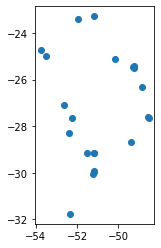

In [69]:
coord_corrigidas.plot()

In [70]:
coord_corrigidas["Capacidade"] = coord_corrigidas["Capacidade"].astype('int64')


In [71]:
coord_corrigidas["Capacidade"]

0     55662
1     22000
2     20160
3     19924
4     19900
5     19584
6     17140
7     16226
8     15765
9     15478
10    15000
11    12859
12    10632
0     50128
1     42372
2     40501
3     30000
4     25000
5     22131
6     17826
7     12500
8     10000
9     10000
Name: Capacidade, dtype: int64

In [72]:
coord_corrigidas["Capacidade"] = coord_corrigidas["Capacidade"].astype('str')

Agora importamos o folium e criamos o mapa interativo

In [73]:
import folium 

In [235]:
# Criei o mapa
estadios_do_rsul = folium.Map(
    
    location=[-15.77972, -47.92972], 
    zoom_start=4)

In [236]:
#Fiz um loop para anexarmos os estádios no mapa
for index, row in coord_corrigidas.iterrows():
    
    folium.Marker([row['Latitude'], row['Longitude']],popup ="Nome: " + row['Estádio'] + '<br>' '<br>'  'Capacidade: '
                  + row['Capacidade'], icon=folium.Icon(color='purple', icon = "marker")).add_to(estadios_do_rsul)

In [237]:
estadios_do_rsul

In [256]:
estados = gpd.read_file("BRUFE250GC_SIR.shp")
estados.head()

,NM_ESTADO,NM_REGIAO,CD_GEOCUF,geometry
0,ACRE,NORTE,12,"POLYGON ((-73.18253 -7.33550, -73.05413 -7.381..."
1,ALAGOAS,NORDESTE,27,"POLYGON ((-35.46659 -8.81764, -35.46658 -8.817..."
2,AMAPÁ,NORTE,16,"MULTIPOLYGON (((-50.18123 1.90099, -50.17688 1..."
3,BAHIA,NORDESTE,29,"MULTIPOLYGON (((-38.65484 -18.04242, -38.65819..."
4,CEARÁ,NORDESTE,23,"POLYGON ((-40.49717 -2.78451, -40.49173 -2.788..."


In [257]:
#Agora selecionamos apenas os estadios da região sul
estados_do_sul = estados.loc[(estados["NM_REGIAO"] == "SUL")]

In [251]:
estados_do_sul

,NM_ESTADO,NM_REGIAO,CD_GEOCUF,geometry
18,RIO GRANDE DO SUL,SUL,43,"POLYGON ((-53.03183 -27.15947, -53.02991 -27.1..."
20,SANTA CATARINA,SUL,42,"MULTIPOLYGON (((-48.82145 -28.61110, -48.82159..."
24,PARANÁ,SUL,41,"POLYGON ((-52.05188 -22.53933, -52.04607 -22.5..."


In [259]:
folium.GeoJson(estados_do_sul).add_to(estadios_do_rsul)

In [ ]:
folium.GeoJson(estados_do_sul).add_to(estadios_do_rsul)

In [253]:
estadios_do_rsul

In [ ]:
#Salvando o arquivo HTML
estadios_do_rsul.save("Mapa Interativo.html")